In [1]:
from main import *
from useful_functions import *
from visualization import *
from stats import *

%matplotlib inline
plt.rcParams['font.size'] = 6

In [2]:
atlas_path = '/home/anleg84/Documents/Atlas/MapzebrainOld/'
atlas = MapzebrainAtlas(atlas_path)
distances = atlas.computeDistanceBetweenRegions()

SC_directed = np.load('Data/directed_terminals_expanded.npy')
SC_undirected = np.load('Data/undirected_terminals_expanded.npy')

FC = np.load('Results/FC_matrix.npy')
triangle = np.triu_indices(FC.shape[0], 1)
excluded = np.load('Results/excluded_regions.npy')
delete = delete_rows_and_columns

In [3]:
region_centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
region_centroids[:, 1] = 974 - region_centroids[:, 1]
#region_centroids = np.delete(region_centroids, np.concatenate([excluded, np.array(excluded) + 70]), axis=0)

red = 1.1 * np.array([186, 44, 102]) / 255
black = [0, 0, 0]
blue = hex2rgb('#006DAA')
white = [1, 1, 1]
colormap = make_cmap([black, blue, white], [0, 0.5, 1])
colormap_red = make_cmap([black, red, white], [0, 0.5, 1])

cmap_div = make_cmap([blue, [1, 1, 1], red], [0, 0.5, 1])

# Spatially-constrained graph null model

In [4]:
from numba import njit

In [5]:
@njit
def SCCM_dir(matrix, distances, N_swaps, delta_D):
    """Spatially constrained configuration model. This null model preserves
    - Degree sequence, exactly
    - Weight distribution, exactly
    - Connection length distribution, approximately
    - Length-weight relationship, approximately"""
    
    edge_ids = np.where(matrix != 0)
    edges, unweighted_edges = [], []
    for i in range(len(edge_ids[0])):
        edges.append((edge_ids[0][i], edge_ids[1][i], matrix[edge_ids[0][i], edge_ids[1][i]]))
        unweighted_edges.append((edge_ids[0][i], edge_ids[1][i]))
        
    while N_swaps > 0:
        id1, id2 = int(np.random.uniform(0, 1) * len(edges)), int(np.random.uniform(0, 1) * len(edges))
        edge1, edge2 = edges[id1], edges[id2]
        nodes = [edge1[0], edge1[1], edge2[0], edge2[1]]
        if (id1 != id2) and (len(set(nodes)) == len(nodes)):
            #if int(np.random.uniform(0, 2)):  # Coin toss
            new_edge1, new_edge2 = (edge2[0], edge1[1], edge1[2]), (edge1[0], edge2[1], edge2[2])
            #new_edge1, new_edge2 = (edge1[0], edge2[1], edge1[2]), (edge2[0], edge1[1], edge2[2])
            #else:
            #    new_edge1, new_edge2 = (edge2[0], edge1[0], edge1[2]), (edge2[1], edge1[1], edge2[2])
            condition1 = abs(distances[new_edge1[0], new_edge1[1]] - distances[edge1[0], edge1[1]]) < delta_D
            condition2 = abs(distances[new_edge2[0], new_edge2[1]] - distances[edge2[0], edge2[1]]) < delta_D
            if condition1 and condition2:
                if ((new_edge1[0], new_edge1[1]) not in unweighted_edges) and ((new_edge2[0], new_edge2[1]) not in unweighted_edges):
                    edges[id1], edges[id2] = new_edge1, new_edge2
                    unweighted_edges[id1], unweighted_edges[id2] = (new_edge1[0], new_edge1[1]), (new_edge2[0], new_edge2[1])
                    N_swaps -= 1
    adjacency_matrix = np.zeros((matrix.shape[0], matrix.shape[0]))
    for edge in edges:
        adjacency_matrix[edge[0], edge[1]] = edge[2]
    return adjacency_matrix

In [6]:
@njit
def SCCM_und(matrix, distances, N_swaps, delta_D):
    """Spatially constrained configuration model, for undirected adjacency matrix. This null model preserves
    - Binary degree sequence, exactly
    - Weight distribution, exactly
    - Connection length distribution, approximately
    - Length-weight relationship, approximately"""

    ids_i, ids_j = np.triu_indices(matrix.shape[0], 1)
    values = []
    for i in range(len(ids_i)):
        values.append(matrix[ids_i[i], ids_j[i]])
    nonzero_ids = np.where(np.array(values) > 0)[0]
    edges, unweighted_edges1, unweighted_edges2 = [], [], []
    for index in nonzero_ids:
        i, j = ids_i[index], ids_j[index]
        edges.append((i, j, matrix[i, j]))
        unweighted_edges1.append((i, j))
        unweighted_edges2.append((j, i))
        
    while N_swaps > 0:
        id1, id2 = int(np.random.uniform(0, 1) * len(edges)), int(np.random.uniform(0, 1) * len(edges))
        edge1, edge2 = edges[id1], edges[id2]
        nodes = [edge1[0], edge1[1], edge2[0], edge2[1]]
        if (id1 != id2) and (len(set(nodes)) == len(nodes)):
            if int(np.random.uniform(0, 2)):  # Coin toss
                new_edge1, new_edge2 = (edge2[0], edge1[1], edge1[2]), (edge1[0], edge2[1], edge2[2])
            else:
                new_edge1, new_edge2 = (edge2[0], edge1[0], edge1[2]), (edge2[1], edge1[1], edge2[2])
            condition1 = abs(distances[new_edge1[0], new_edge1[1]] - distances[edge1[0], edge1[1]]) < delta_D
            condition2 = abs(distances[new_edge2[0], new_edge2[1]] - distances[edge2[0], edge2[1]]) < delta_D
            if condition1 and condition2:
                condition1 = (new_edge1[0], new_edge1[1]) not in unweighted_edges1
                condition2 = (new_edge1[0], new_edge1[1]) not in unweighted_edges2
                condition3 = (new_edge2[0], new_edge2[1]) not in unweighted_edges1
                condition4 = (new_edge2[0], new_edge2[1]) not in unweighted_edges2
                c1 = condition1 & condition2
                c2 = condition3 & condition4
                if c1 and c2:
                    edges[id1], edges[id2] = new_edge1, new_edge2
                    unweighted_edges1[id1], unweighted_edges1[id2] = (new_edge1[0], new_edge1[1]), (new_edge2[0], new_edge2[1])
                    unweighted_edges2[id1], unweighted_edges2[id2] = (new_edge1[1], new_edge1[0]), (new_edge2[1], new_edge2[0])
                    N_swaps -= 1
    adjacency_matrix = np.zeros((matrix.shape[0], matrix.shape[0]))
    for edge in edges:
        adjacency_matrix[edge[0], edge[1]] = edge[2]
        adjacency_matrix[edge[1], edge[0]] = edge[2]
    return adjacency_matrix

#### Temporary: Generating 1000 null SCCM graphs for sparse SC

In [9]:
SC_directed = np.load('Data/directed_terminals.npy')

In [10]:
null_SC_dir = []
for _ in tqdm(range(1000), file=sys.stdout):
    W = SCCM_dir(SC_directed, distances, N_swaps=50000, delta_D=30)
    null_SC_dir.append(W)

100%|███████████████████████████████████████| 1000/1000 [22:28<00:00,  1.35s/it]


In [11]:
null_SC_dir = np.save('Results/null_SC_dir_SCCM_sparse.npy', null_SC_dir)

In [7]:
SC_undirected = np.load('Data/undirected_terminals.npy')

In [8]:
null_SC_und = []
for _ in tqdm(range(1000), file=sys.stdout):
    W = SCCM_und(SC_undirected, distances, N_swaps=50000, delta_D=30)
    null_SC_und.append(W)

100%|███████████████████████████████████████| 1000/1000 [26:08<00:00,  1.57s/it]


In [9]:
np.save('Results/null_SC_und_SCCM_sparse.npy', null_SC_und)

#### Generating 10000 null SCCM graphs (directed)

Max distance swap = 30 microns. 50000 edge swaps.

In [202]:
null_SC_dir = []
for _ in tqdm(range(1), file=sys.stdout):
    W = SCCM_dir(SC_directed, distances, N_swaps=50000, delta_D=30)
    null_SC_dir.append(W)

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.87s/it]


#### Generating 10000 null SCCM graphs (undirected)

In [203]:
null_SC_und = []
for _ in tqdm(range(1), file=sys.stdout):
    W = SCCM_und(SC_undirected, distances, N_swaps=50000, delta_D=30)
    null_SC_und.append(W)

100%|█████████████████████████████████████████████| 1/1 [00:13<00:00, 13.19s/it]


null_graphs = np.stack(null_graphs, axis=0)
np.save('Data/null_SC_expanded_deltaD_30.npy', null_graphs)

#### Generating 10000 null CM graphs (directed)

In [204]:
null_SC_dir_CM = []
for _ in tqdm(range(1), file=sys.stdout):
    W = SCCM_dir(SC_directed, distances, N_swaps=50000, delta_D=1e6)
    null_SC_dir_CM.append(W)

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]


#### Generating 10000 null CM graphs (undirected)

In [205]:
null_SC_und_CM = []
for _ in tqdm(range(1), file=sys.stdout):
    W = SCCM_und(SC_undirected, distances, N_swaps=50000, delta_D=1e6)
    null_SC_und_CM.append(W)

100%|█████████████████████████████████████████████| 1/1 [00:07<00:00,  7.26s/it]


#### Loading null graphs

Due to computing time, these matrices were generated separately using Compute Canada, using the same functions as defined above.

In [10]:
null_SC_dir = np.load('Results/null_SC_dir_SCCM.npy')
null_SC_und = np.load('Results/null_SC_und_SCCM.npy')
null_SC_dir_CM = np.load('Results/null_SC_dir_CM.npy')
null_SC_und_CM = np.load('Results/null_SC_und_CM.npy')

# Generating supplementary figure

In [11]:
def draw_graph(ax, adjacency, centroids, directed=False, percentile=75, s=40, node_color='white', linewidth=1.5, edge_color='white', alpha=0.75, edge_cmap='hot', edge_vmin=0, edge_vmax=1, flip_order=False, node_edgecolor='black', node_edgewidth=1, rasterized=False):
    edge_list = get_edgelist(adjacency, directed=directed)
    edge_array = np.array(edge_list)
    edge_ids = edge_array[:, 2] >= np.percentile(edge_array[:, 2], percentile)
    edge_list = list(edge_array[edge_ids, :])
    edge_position = get_edge_positions(centroids, edge_list)
    weights = np.array(edge_list)[:, 2]
    order = np.argsort(weights)
    if flip_order:
        order = np.flip(order)
    sorted_positions = []
    for i in order:
        sorted_positions.append(edge_position[i])
    edge_collection = LineCollection(
            sorted_positions,
            array=weights[order],
            cmap=edge_cmap,
            linewidths=weights[order] * linewidth,
            antialiaseds=(1,),
            alpha=(np.abs(weights[order]) / np.max(np.abs(weights[order]))) * alpha,
            rasterized=rasterized
        )
    edge_collection.set_clim(edge_vmin, edge_vmax)
    edge_collection.set_zorder(1)
    ax.scatter(centroids[:, 0], centroids[:, 1], color=node_color, zorder=10, s=s, edgecolor=node_edgecolor, linewidths=node_edgewidth, rasterized=rasterized)
    ax.add_collection(edge_collection)

In [12]:
weights_SC = SC_directed[SC_directed != 0]
distances_SC = distances[SC_directed != 0]

weights_SCCM = null_SC_dir[0][null_SC_dir[0] != 0]
distances_SCCM = distances[null_SC_dir[0] != 0]

weights_CM = null_SC_dir_CM[0][null_SC_dir_CM[0] != 0]
distances_CM = distances[null_SC_dir_CM[0] != 0]

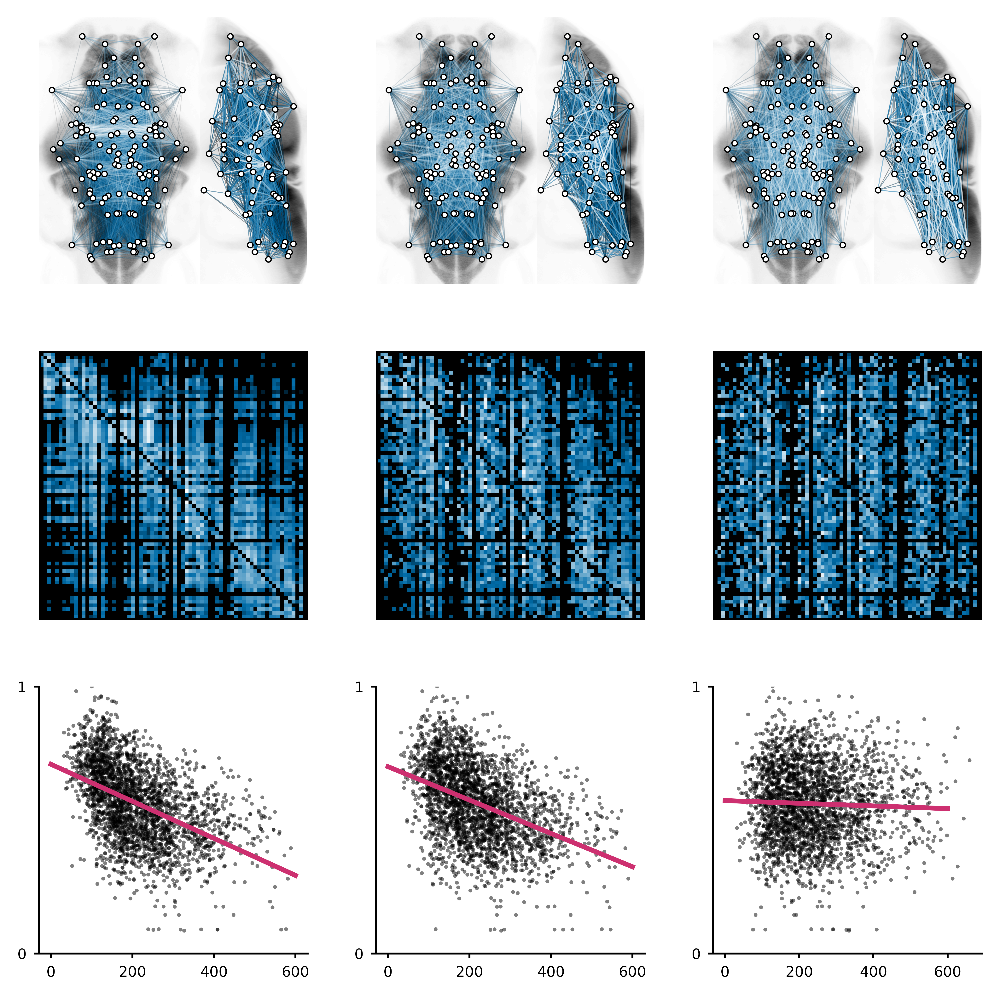

In [14]:
fig = PaperFigure(figsize=(7, 7), dpi=900)

fig.set_tick_length(2)
fig.set_font_size(6)
fig.add_background() 

# Layout ------------------------------------------------------------------------------------

w = 2
pad = 0.5
fig.add_axes('graph_top', (0, 0), 0.6 * w, w)
fig.add_axes('graph_side', (0.6 * w, 0), 0.4 * w, w)

fig.add_axes('graph_top_SCCM', (1 * (pad + w), 0), 0.6 * w, w)
fig.add_axes('graph_side_SCCM', (1 * (pad + w) + 0.6 * w, 0), 0.4 * w, w)

fig.add_axes('graph_top_CM', (2 * (pad + w), 0), 0.6 * w, w)
fig.add_axes('graph_side_CM', (2 * (pad + w) + 0.6 * w, 0), 0.4 * w, w)

fig.add_axes('adjacency', (0, 2 + pad), w, w)
fig.add_axes('adjacency_SCCM', (1 * (w + pad), 2 + pad), w, w)
fig.add_axes('adjacency_CM', (2 * (w + pad), 2 + pad), w, w)

fig.add_axes('scatter_SC', (0, 4 + 2 * pad), w, w)
fig.add_axes('scatter_SCCM', (1 * (w + pad), 4 + 2 * pad), w, w)
fig.add_axes('scatter_CM', (2 * (w + pad), 4 + 2 * pad), w, w)

# Display -----------------------------------------------------------------------------------

SC = np.copy(SC_undirected)

ax = fig.axes['graph_top']
bbox = ax.get_position()
x0, y1 = bbox.x0, bbox.y1
ax.imshow(atlas.XYprojection, cmap='binary', aspect='auto')
draw_graph(ax, np.tile(SC, (2, 2)), region_centroids, percentile=25, s=5, edge_cmap=colormap, alpha=0.25, edge_vmin=0.5, edge_vmax=0.9,
          linewidth=0.5, node_edgewidth=0.5, rasterized=True)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.axis('off')

ax = fig.axes['graph_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), cmap='binary', aspect='auto')
c = np.flip(np.delete(region_centroids, 0, axis=1), axis=1)
c[:, 0] = 359 - c[:, 0]
draw_graph(ax, np.tile(SC, (2, 2)), c, percentile=25,
           s=5, edge_cmap=colormap, alpha=0.25, edge_vmin=0.5, edge_vmax=0.9, node_edgewidth=0.5, linewidth=0.5, rasterized=True)
ax.set_xlim([30, 359])
ax.set_ylim([850, 50])
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

SC = null_SC_und[0]

ax = fig.axes['graph_top_SCCM']
bbox = ax.get_position()
x0, y1 = bbox.x0, bbox.y1
ax.imshow(atlas.XYprojection, cmap='binary', aspect='auto')
draw_graph(ax, np.tile(SC, (2, 2)), region_centroids, percentile=25, s=5, edge_cmap=colormap, alpha=0.25, edge_vmin=0.5, edge_vmax=0.9,
          linewidth=0.5, node_edgewidth=0.5, rasterized=True)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.axis('off')

ax = fig.axes['graph_side_SCCM']
ax.imshow(np.rot90(atlas.XZprojection, k=3), cmap='binary', aspect='auto')
c = np.flip(np.delete(region_centroids, 0, axis=1), axis=1)
c[:, 0] = 359 - c[:, 0]
draw_graph(ax, np.tile(SC, (2, 2)), c, percentile=25,
           s=5, edge_cmap=colormap, alpha=0.25, edge_vmin=0.5, edge_vmax=0.9, node_edgewidth=0.5, linewidth=0.5, rasterized=True)
ax.set_xlim([30, 359])
ax.set_ylim([850, 50])
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

SC = null_SC_und_CM[0]

ax = fig.axes['graph_top_CM']
bbox = ax.get_position()
x0, y1 = bbox.x0, bbox.y1
ax.imshow(atlas.XYprojection, cmap='binary', aspect='auto')
draw_graph(ax, np.tile(SC, (2, 2)), region_centroids, percentile=25, s=5, edge_cmap=colormap, alpha=0.25, edge_vmin=0.5, edge_vmax=0.9,
          linewidth=0.5, node_edgewidth=0.5, rasterized=True)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.axis('off')

ax = fig.axes['graph_side_CM']
ax.imshow(np.rot90(atlas.XZprojection, k=3), cmap='binary', aspect='auto')
c = np.flip(np.delete(region_centroids, 0, axis=1), axis=1)
c[:, 0] = 359 - c[:, 0]
draw_graph(ax, np.tile(SC, (2, 2)), c, percentile=25,
           s=5, edge_cmap=colormap, alpha=0.25, edge_vmin=0.5, edge_vmax=0.9, node_edgewidth=0.5, linewidth=0.5, rasterized=True)
ax.set_xlim([30, 359])
ax.set_ylim([850, 50])
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

ax = fig.axes['adjacency']
ax.imshow(SC_directed, cmap=colormap)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['adjacency_SCCM']
ax.imshow(null_SC_dir[0], cmap=colormap)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['adjacency_CM']
ax.imshow(null_SC_dir_CM[0], cmap=colormap)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['scatter_SC']
ax.scatter(distances_SC, weights_SC, color='black', s=2.5, edgecolor='None', alpha=0.5, rasterized=True)
a, b = np.polyfit(distances_SC, weights_SC, deg=1)
x = np.linspace(0, 600)
y = a * x + b
ax.plot(x, y, color=red, linewidth=2)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim([0, 1])
ax.set_yticks([0, 1])

ax = fig.axes['scatter_SCCM']
ax.scatter(distances_SCCM, weights_SCCM, color='black', s=2.5, edgecolor='None', alpha=0.5, rasterized=True)
a, b = np.polyfit(distances_SCCM, weights_SCCM, deg=1)
x = np.linspace(0, 600)
y = a * x + b
ax.plot(x, y, color=red, linewidth=2)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim([0, 1])
ax.set_yticks([0, 1])

ax = fig.axes['scatter_CM']
ax.scatter(distances_CM, weights_CM, color='black', s=2.5, edgecolor='None', alpha=0.5, rasterized=True)
a, b = np.polyfit(distances_CM, weights_CM, deg=1)
x = np.linspace(0, 600)
y = a * x + b
ax.plot(x, y, color=red, linewidth=2)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim([0, 1])
ax.set_yticks([0, 1])

fig.show()

region_id += 1

In [281]:
fig.save('/home/anleg84/Documents/Figures/PaperNetworks2024/supp_SCCM_incomplete.svg')

#### Manually indicating correlations

Values might change slightly depending on RNG (plotting one example matrix out of a random distribution).

In [15]:
pearsonr(weights_SC, distances_SC)

(-0.469576188810621, 4.485066771339131e-149)

In [16]:
pearsonr(weights_SCCM, distances_SCCM)

(-0.4221581420731318, 6.938803305397463e-118)

In [17]:
pearsonr(weights_CM, distances_CM)

(-0.03760916044724808, 0.04997671767076604)

# Generating supplementary figure (SC-FC relationship)

In [18]:
FC = np.load('Results/FC_matrix.npy')
FC_matrices = np.load('Results/FC_matrices.npy')
excluded = np.load('Results/excluded_regions.npy')

In [19]:
delete = delete_rows_and_columns
triangle = np.triu_indices(FC.shape[0], 1)

In [20]:
def shuffle_adjacency(matrix):
    if np.array_equal(matrix, matrix.T):
        directed = False
    else:
        directed = True
    triangle = np.triu_indices(matrix.shape[0], 1)
    if directed:
        values1 = matrix[triangle]
        values2 = matrix.T[triangle]
        values = np.concatenate([values1, values2])
        np.random.shuffle(values)
        values1 = values[:len(triangle[0])]
        values2 = values[len(triangle[0]):]
        shuffled = np.zeros(matrix.shape)
        shuffled[triangle] = values1
        shuffled = shuffled.T
        shuffled[triangle] = values2
    else:
        values = matrix[triangle]
        np.random.shuffle(values)
        shuffled = np.zeros(matrix.shape)
        shuffled[triangle] = values
        shuffled = shuffled.T
        shuffled[triangle] = values
    return shuffled

In [21]:
null_SC_shuffled = []
for _ in range(1000):
    W = shuffle_adjacency(SC_undirected)
    null_SC_shuffled.append(W)

null_SC_dir_shuffled = []
for _ in range(1000):
    W = shuffle_adjacency(SC_directed)
    null_SC_dir_shuffled.append(W)

In [22]:
empirical_correlation = pearsonr(FC[triangle], delete(SC_undirected, excluded)[triangle])[0]

null_correlations_SCCM = []
for W in null_SC_und:
    W_truncated = delete(W, excluded)
    r = pearsonr(FC[triangle], W_truncated[triangle])[0]
    null_correlations_SCCM.append(r)

null_correlations_CM = []
for W in null_SC_und_CM:
    W_truncated = delete(W, excluded)
    r = pearsonr(FC[triangle], W_truncated[triangle])[0]
    null_correlations_CM.append(r)

null_correlations_shuffled = []
for W in null_SC_shuffled:
    W_truncated = delete(W, excluded)
    r = pearsonr(FC[triangle], W_truncated[triangle])[0]
    null_correlations_shuffled.append(r)

In [23]:
np.save('Results/figure2_null_SC-FC_corrs_SCCM.npy', null_correlations_SCCM)
np.save('Results/figure2_null_SC-FC_corrs_CM.npy', null_correlations_CM)
np.save('Results/figure2_null_SC-FC_corrs_shuffled.npy', null_correlations_shuffled)

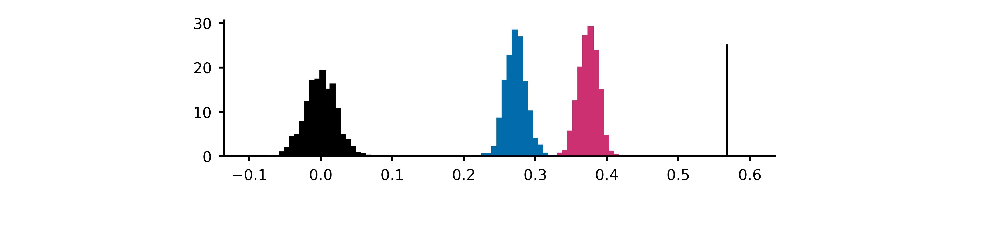

In [156]:
fig = PaperFigure(figsize=(7, 1.5), dpi=900)

fig.set_tick_length(2)
fig.set_font_size(6)
fig.add_background() 

fig.add_axes('histograms', (1.5, 0), 4, 1)

ax = fig.axes['histograms']
bins = np.linspace(-0.1, 0.6, 100)
ax.hist(null_correlations_SCCM, bins, facecolor=red, edgecolor=red, alpha=1, density=True, linewidth=0.5)
ax.hist(null_correlations_CM, bins, facecolor=blue, edgecolor=blue, alpha=1, density=True, linewidth=0.5)
ax.hist(null_correlations_shuffled, bins, facecolor='black', edgecolor='black', alpha=1, density=True, linewidth=0.5)

ax.plot([empirical_correlation, empirical_correlation], [0, 25], color='black', linewidth=1)
ax.spines[['top', 'right']].set_visible(False)

# ------------------------------------------------------------------------------------

fig.show()

fig.save('/home/anleg84/Documents/Figures/PaperNetworks2024/Supplementary/supp_SC-FC_incomplete.svg')

# Generating supplementary figure (directionality)

In [12]:
FC = np.load('Results/FC_matrix.npy')
FC_matrices = np.load('Results/FC_matrices.npy')
excluded = np.load('Results/excluded_regions.npy')

In [13]:
delete = delete_rows_and_columns
triangle = np.triu_indices(FC.shape[0], 1)

In [114]:
def compute_directionality_distributions(networks, connectome):
    binary_connections = (connectome > 0).astype('int')
    number_of_connections = binary_connections + binary_connections.T
    corrs_0, corrs_1, corrs_2 = [], [], []
    triangle = np.triu_indices(connectome.shape[0], 1)
    for network in networks:
        corrs_0.append(network[triangle][number_of_connections[triangle] == 0])
        corrs_1.append(network[triangle][number_of_connections[triangle] == 1])
        corrs_2.append(network[triangle][number_of_connections[triangle] == 2])
    corrs_0 = np.array(corrs_0).flatten()
    corrs_0 = corrs_0[corrs_0 != 0]
    corrs_1 = np.array(corrs_1).flatten()
    corrs_1 = corrs_1[corrs_1 != 0]
    corrs_2 = np.array(corrs_2).flatten()
    corrs_2 = corrs_2[corrs_2 != 0]
    return corrs_0, corrs_1, corrs_2

In [221]:
corrs_0, corrs_1, corrs_2 = compute_directionality_distributions(FC_matrices, delete(SC_directed, excluded))
corrs_0_SCCM, corrs_1_SCCM, corrs_2_SCCM = compute_directionality_distributions(FC_matrices, delete(null_SC_dir[0], excluded))
corrs_0_CM, corrs_1_CM, corrs_2_CM = compute_directionality_distributions(FC_matrices, delete(null_SC_dir_CM[0], excluded))
corrs_0_shuffled, corrs_1_shuffled, corrs_2_shuffled = compute_directionality_distributions(FC_matrices, delete(null_SC_dir_shuffled[0], excluded))

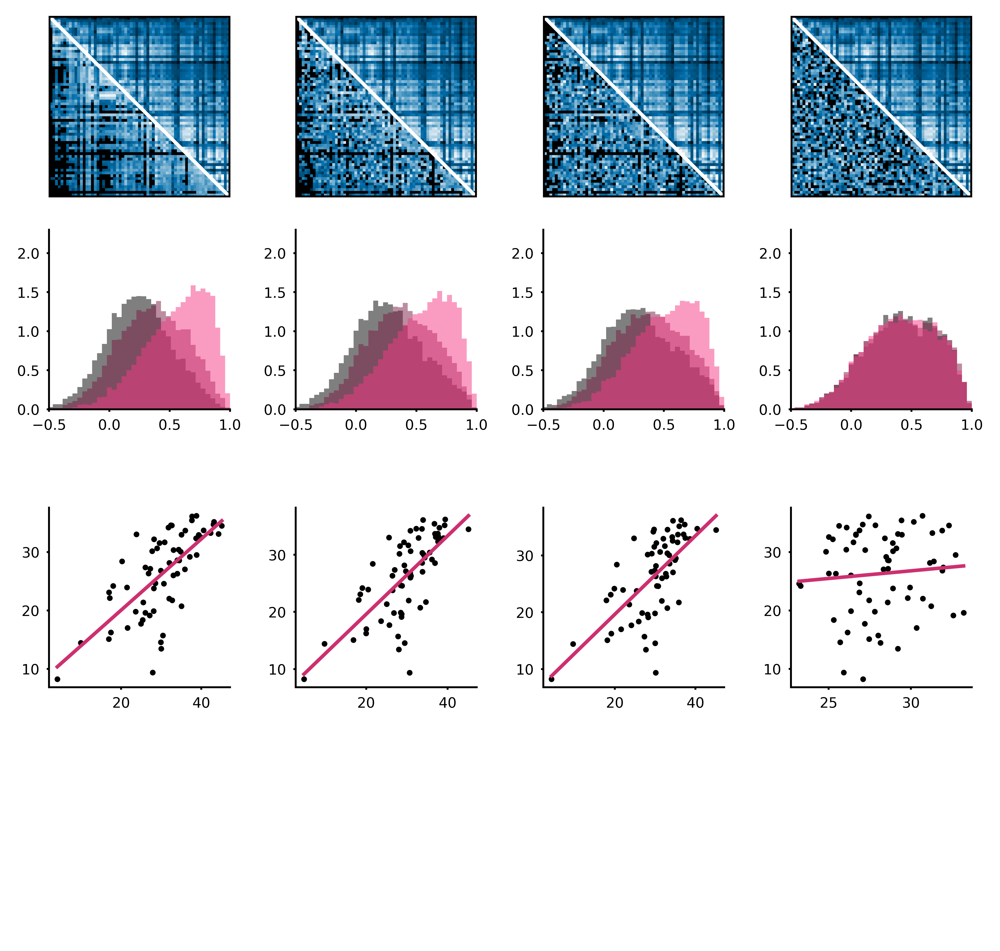

In [222]:
fig = PaperFigure(figsize=(7, 7), dpi=900)

fig.set_tick_length(1)
fig.set_font_size(6)
fig.add_background() 

pad = 0.5
w = (7 - 3 * pad) / 4

fig.add_axes('comparison1', (0 * (w + pad), 0), w, w)
fig.add_axes('comparison2', (1 * (w + pad), 0), w, w)
fig.add_axes('comparison3', (2 * (w + pad), 0), w, w)
fig.add_axes('comparison4', (3 * (w + pad), 0), w, w)

fig.add_axes('distributions1', (0 * (w + pad), w + pad/2), w, w)
fig.add_axes('distributions2', (1 * (w + pad), w + pad/2), w, w)
fig.add_axes('distributions3', (2 * (w + pad), w + pad/2), w, w)
fig.add_axes('distributions4', (3 * (w + pad), w + pad/2), w, w)

fig.add_axes('degrees1', (0 * (w + pad), 2 * (w + pad)), w, w)
fig.add_axes('degrees2', (1 * (w + pad), 2 * (w + pad)), w, w)
fig.add_axes('degrees3', (2 * (w + pad), 2 * (w + pad)), w, w)
fig.add_axes('degrees4', (3 * (w + pad), 2 * (w + pad)), w, w)

ax = fig.axes['comparison1']
matrix = normalize(np.copy(FC))
matrix[triangle] = normalize(np.copy(SC_undirected))[triangle]
cax = ax.imshow(matrix.T, cmap=colormap)
ax.plot([0, 64.5], [0, 64.5], color='white', linewidth=1.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['comparison2']
matrix = normalize(np.copy(FC))
matrix[triangle] = normalize(np.copy(null_SC_und[1]))[triangle]
cax = ax.imshow(matrix.T, cmap=colormap)
ax.plot([0, 64.5], [0, 64.5], color='white', linewidth=1.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['comparison3']
matrix = normalize(np.copy(FC))
matrix[triangle] = normalize(np.copy(null_SC_und_CM[0]))[triangle]
cax = ax.imshow(matrix.T, cmap=colormap)
ax.plot([0, 64.5], [0, 64.5], color='white', linewidth=1.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['comparison4']
matrix = normalize(np.copy(FC))
matrix[triangle] = normalize(np.copy(null_SC_shuffled[0]))[triangle]
cax = ax.imshow(matrix.T, cmap=colormap)
ax.plot([0, 64.5], [0, 64.5], color='white', linewidth=1.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['distributions1']
bins = np.linspace(-1, 1, 50)
ax.hist(corrs_0, bins, color='black', edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_1, bins, color=0.6 * red, edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_2, bins, color=1.2 * red, edgecolor='none', alpha=0.5, density=True)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.5, 1])
ax.set_ylim([0, 2.3])

ax = fig.axes['distributions2']
bins = np.linspace(-1, 1, 50)
ax.hist(corrs_0_SCCM, bins, color='black', edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_1_SCCM, bins, color=0.6 * red, edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_2_SCCM, bins, color=1.2 * red, edgecolor='none', alpha=0.5, density=True)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.5, 1])
ax.set_ylim([0, 2.3])

ax = fig.axes['distributions3']
bins = np.linspace(-1, 1, 50)
ax.hist(corrs_0_CM, bins, color='black', edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_1_CM, bins, color=0.6 * red, edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_2_CM, bins, color=1.2 * red, edgecolor='none', alpha=0.5, density=True)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.5, 1])
ax.set_ylim([0, 2.3])

ax = fig.axes['distributions4']
bins = np.linspace(-1, 1, 50)
ax.hist(corrs_0_shuffled, bins, color='black', edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_1_shuffled, bins, color=0.6 * red, edgecolor='none', alpha=0.5, density=True)
ax.hist(corrs_2_shuffled, bins, color=1.2 * red, edgecolor='none', alpha=0.5, density=True)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.5, 1])
ax.set_ylim([0, 2.3])

ax = fig.axes['degrees1']
SC = delete(SC_undirected, excluded)
ax.scatter(np.sum(SC, axis=1), np.sum(FC, axis=1), color='black', s=2)
a, b = np.polyfit(np.sum(SC, axis=1), np.sum(FC, axis=1), deg=1)
x = np.linspace(np.min(np.sum(SC, axis=1)), np.max(np.sum(SC, axis=1)))
y = a * x + b
ax.plot(x, y, color=red, linewidth=1.5)
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['degrees2']
SC = delete(null_SC_und[0], excluded)
ax.scatter(np.sum(SC, axis=1), np.sum(FC, axis=1), color='black', s=2)
a, b = np.polyfit(np.sum(SC, axis=1), np.sum(FC, axis=1), deg=1)
x = np.linspace(np.min(np.sum(SC, axis=1)), np.max(np.sum(SC, axis=1)))
y = a * x + b
ax.plot(x, y, color=red, linewidth=1.5)
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['degrees3']
SC = delete(null_SC_und_CM[0], excluded)
ax.scatter(np.sum(SC, axis=1), np.sum(FC, axis=1), color='black', s=2)
a, b = np.polyfit(np.sum(SC, axis=1), np.sum(FC, axis=1), deg=1)
x = np.linspace(np.min(np.sum(SC, axis=1)), np.max(np.sum(SC, axis=1)))
y = a * x + b
ax.plot(x, y, color=red, linewidth=1.5)
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['degrees4']
SC = delete(null_SC_shuffled[3], excluded)
ax.scatter(np.sum(SC, axis=1), np.sum(FC, axis=1), color='black', s=2)
a, b = np.polyfit(np.sum(SC, axis=1), np.sum(FC, axis=1), deg=1)
x = np.linspace(np.min(np.sum(SC, axis=1)), np.max(np.sum(SC, axis=1)))
y = a * x + b
ax.plot(x, y, color=red, linewidth=1.5)
ax.spines[['top', 'right']].set_visible(False)

# ------------------------------------------------------------------------------------

fig.show()

In [238]:
fig.save('/home/anleg84/Documents/Figures/PaperNetworks2024/Supplementary/supp_distances_incomplete.svg')

#### Manually computing stats

ANOVAS

In [224]:
data = [corrs_0[np.logical_not(np.isnan(corrs_0))],
        corrs_1[np.logical_not(np.isnan(corrs_1))],
        corrs_2[np.logical_not(np.isnan(corrs_2))]]

In [225]:
groups_ANOVA_Tukey(data)

ANOVA results: F = 5047.881242339334, p = 0.0

Multiple Comparison of Means - Tukey HSD, FWER=0.05
 group1  group2 meandiff p-adj lower  upper  reject
---------------------------------------------------
Group 1 Group 2   0.1121  -0.0 0.1041 0.1201   True
Group 1 Group 3   0.3121  -0.0 0.3043 0.3198   True
Group 2 Group 3   0.1999  -0.0 0.1932 0.2067   True
---------------------------------------------------


In [226]:
data = [corrs_0_SCCM[np.logical_not(np.isnan(corrs_0_SCCM))],
        corrs_1_SCCM[np.logical_not(np.isnan(corrs_1_SCCM))],
        corrs_2_SCCM[np.logical_not(np.isnan(corrs_2_SCCM))]]

In [227]:
groups_ANOVA_Tukey(data)

ANOVA results: F = 3210.980451652937, p = 0.0

Multiple Comparison of Means - Tukey HSD, FWER=0.05
 group1  group2 meandiff p-adj lower  upper  reject
---------------------------------------------------
Group 1 Group 2   0.1045  -0.0 0.0962 0.1129   True
Group 1 Group 3   0.2662  -0.0  0.258 0.2745   True
Group 2 Group 3   0.1617  -0.0 0.1548 0.1686   True
---------------------------------------------------


In [228]:
data = [corrs_0_CM[np.logical_not(np.isnan(corrs_0_CM))],
        corrs_1_CM[np.logical_not(np.isnan(corrs_1_CM))],
        corrs_2_CM[np.logical_not(np.isnan(corrs_2_CM))]]

In [229]:
groups_ANOVA_Tukey(data)

ANOVA results: F = 1985.629751864876, p = 0.0

Multiple Comparison of Means - Tukey HSD, FWER=0.05
 group1  group2 meandiff p-adj lower  upper  reject
---------------------------------------------------
Group 1 Group 2   0.0732  -0.0 0.0647 0.0818   True
Group 1 Group 3   0.2117  -0.0 0.2031 0.2202   True
Group 2 Group 3   0.1384  -0.0 0.1314 0.1455   True
---------------------------------------------------


In [231]:
data = [corrs_0_shuffled[np.logical_not(np.isnan(corrs_0_shuffled))],
        corrs_1_shuffled[np.logical_not(np.isnan(corrs_1_shuffled))],
        corrs_2_shuffled[np.logical_not(np.isnan(corrs_2_shuffled))]]

In [232]:
groups_ANOVA_Tukey(data)

ANOVA results: F = 1.2288611572415502, p = 0.29263546358008585



Correlation coefficients

In [235]:
SC = delete(SC_undirected, excluded)
pearsonr(np.sum(SC, axis=1), np.sum(FC, axis=1))

(0.6937727891211727, 1.4849549093079799e-10)

In [236]:
SC = delete(null_SC_und[0], excluded)
pearsonr(np.sum(SC, axis=1), np.sum(FC, axis=1))

(0.6956835438841963, 1.2600444203017552e-10)

In [237]:
SC = delete(null_SC_und_CM[0], excluded)
pearsonr(np.sum(SC, axis=1), np.sum(FC, axis=1))

(0.6702288795981092, 1.0176901847295828e-09)

In [233]:
SC = delete(null_SC_shuffled[3], excluded)
pearsonr(np.sum(SC, axis=1), np.sum(FC, axis=1))

(0.08678273739967876, 0.49183853549130474)